<a href="https://colab.research.google.com/github/anytokin/opencv-course/blob/master/polish_beer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install kaggle

In [ ]:
with open("kaggle.json","w") as file:
  file.write('{"username":"dawidkohnkecad","key":"46da90631180eeabab4c5e75039beb5e"}')

In [ ]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d zozolla/polish-craft-beer-labels 

 99% 132M/133M [00:00<00:00, 143MB/s]
100% 133M/133M [00:00<00:00, 165MB/s]


In [ ]:
! mkdir polish-craft-beer-labels
! unzip polish-craft-beer-labels.zip -d polish-craft-beer-labels

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_4_5752132.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_50_4779080.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_51_3636175.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_52_9053639.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_53_2862871.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_54_7793042.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_55_6363727.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_56_8477189.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_57_5516354.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_58_4936294.jpg  
  inflating: polish-craft-beer-labels/beer_labels/5905279156067/_59_1772562.jpg  
  inflating: polish-craft-beer-lab

In [ ]:
!mkdir beer_labels
! cp -r polish-craft-beer-labels/beer_labels .
!rm -r polish-craft-beer-labels/

mkdir: cannot create directory ‘beer_labels’: File exists


In [ ]:
from tensorflow.core.framework.full_type_pb2 import TFT_ANY
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
import kaggle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
import pathlib
data_dir = pathlib.Path("beer_labels")
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

8007


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


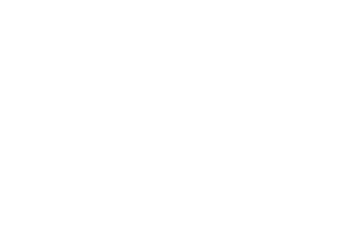

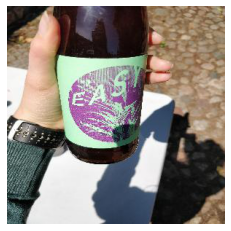

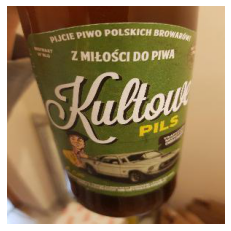

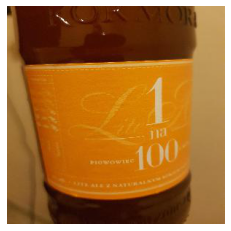

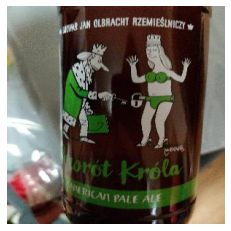

...

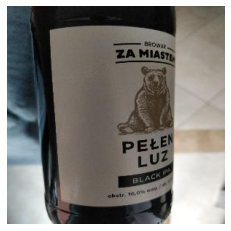

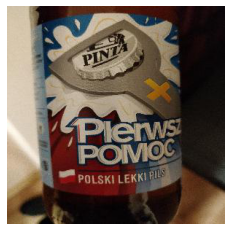

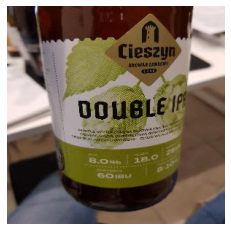

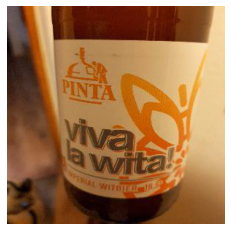

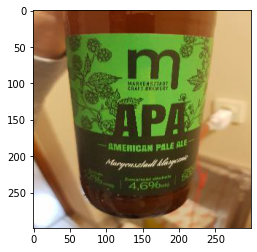

In [ ]:
for dir in data_dir.iterdir():
  beer_name =str(dir)[12:]
  beer = list(data_dir.glob(f'{beer_name}/*'))
  img = mpimg.imread(str(beer[0]))
  plt.axis("off")
  plt.figure()
  plt.imshow(img)
  

In [ ]:
batch_size = 32
img_height = 180
img_width = 180

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.51,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 8007 files belonging to 100 classes.
Using 3924 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.51,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 8007 files belonging to 100 classes.
Using 4083 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['5901549250329', '5901549250756', '5902448150178', '5902528052347', '5902528442230', '5902528443251', '5902528462337', '5902528473449', '5902528523311', '5902528573354', '5902528999994', '5902627011481', '5902705000871', '5902705001045', '5902931900112', '5902931900310', '5902931900419', '5903031401516', '5903111989811', '5903111989835', '5903111989873', '5903240620142', '5903240674145', '5903240674527', '5903292264004', '5903292264455', '5904730284004', '5904730284028', '5904730284035', '5904730284561', '5904730284660', '5904730290067', '5904730290074', '5904730438001', '5904730438575', '5904730438582', '5904730438605', '5904730465243', '5905279156067', '5905279213005', '5905279213210', '5905279213272', '5905279326224', '5905279326262', '5905279533240', '5905279533264', '5905279959521', '5905279959637', '5905279959743', '5905279965102', '5905279965201', '5905279965454', '5905331025362', '5905331025935', '5905669086233', '5905669086240', '5905669086455', '5905669479196', '590566947920

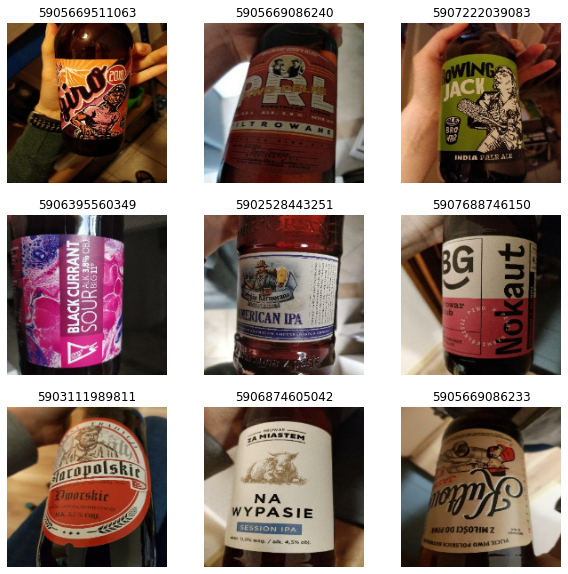

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
normalization_layer = layers.Rescaling(1./255)

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [ ]:
num_classes = len(class_names)

model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.25),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                  

In [ ]:
epochs = 5
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5
123/123 [==============================] - 25s 94ms/step - loss: 4.0844 - accuracy: 0.1014 - val_loss: 2.8405 - val_accuracy: 0.3027
Epoch 2/5
123/123 [==============================] - 7s 58ms/step - loss: 1.9442 - accuracy: 0.4890 - val_loss: 1.4390 - val_accuracy: 0.5937
Epoch 3/5
123/123 [==============================] - 7s 58ms/step - loss: 1.0793 - accuracy: 0.6911 - val_loss: 0.8648 - val_accuracy: 0.7323
Epoch 4/5
123/123 [==============================] - 7s 58ms/step - loss: 0.7624 - accuracy: 0.7765 - val_loss: 0.9804 - val_accuracy: 0.7274
Epoch 5/5
123/123 [==============================] - 7s 58ms/step - loss: 0.5792 - accuracy: 0.8257 - val_loss: 0.5727 - val_accuracy: 0.8241


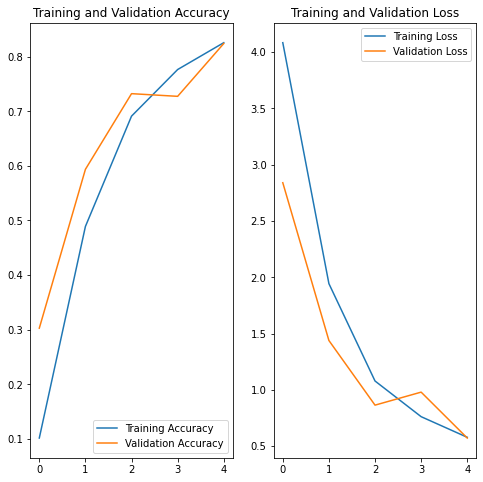

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd

y_pred = model.predict(val_ds)
y_pred = np.argmax(y_pred, axis=1)

y_true = np.concatenate([y for x, y in val_ds], axis=0)

cr = classification_report(y_true, y_pred, output_dict=True, target_names=class_names)
pd.DataFrame.from_dict(cr)

,5901549250329,5901549250756,5902448150178,5902528052347,5902528442230,5902528443251,5902528462337,5902528473449,5902528523311,5902528573354,5902528999994,5902627011481,5902705000871,5902705001045,5902931900112,5902931900310,5902931900419,5903031401516,5903111989811,5903111989835,5903111989873,5903240620142,5903240674145,5903240674527,5903292264004,5903292264455,5904730284004,5904730284028,5904730284035,5904730284561,5904730284660,5904730290067,5904730290074,5904730438001,5904730438575,5904730438582,5904730438605,5904730465243,5905279156067,5905279213005,...,5905669542722,5905669542821,5905669683005,5905669683012,5905669683647,5905669783019,5905669783033,5905669783095,5905669783255,5905669897105,5905912650020,5906395497782,5906395560349,5906591000540,5906591000663,5906591001332,5906591001479,5906591001899,5906874346198,5906874605004,5906874605011,5906874605028,5906874605035,5906874605042,5906874605059,5906874605066,5906874605073,5906874605141,5907222039083,5907222604120,5907222604595,5907431705083,5907431705090,5907431705359,5907637971480,5907688746143,5907688746150,accuracy,macro avg,weighted avg
precision,0.921053,1.000000,0.884615,0.883721,0.6,0.800000,0.619048,0.809524,1.000000,0.641026,0.962963,0.954545,0.733333,0.906977,1.000000,0.970588,0.937500,1.000000,0.794118,0.824561,1.000000,1.000000,1.000000,0.775862,0.857143,0.886364,0.710526,1.000000,1.000000,0.425532,0.848485,0.925000,1.000000,0.851064,0.758621,1.000000,0.950000,0.888889,1.000000,1.000000,...,0.925000,0.977273,0.770833,0.821429,1.000000,0.809524,0.674419,0.925000,0.859649,0.902439,0.659091,0.875000,0.936170,0.894737,1.000000,0.970588,0.830189,0.957447,0.975610,1.000000,0.461538,0.540541,0.311321,1.000000,0.555556,0.869565,0.540541,0.661290,0.952381,0.916667,1.000000,0.540984,0.960000,0.892857,0.941176,0.954545,0.711864,0.824149,0.848728,0.855621
recall,0.714286,0.323529,0.851852,0.950000,0.6,0.782609,0.342105,0.485714,0.966667,0.806452,0.764706,0.913043,0.942857,0.975000,0.913043,0.733333,0.882353,0.818182,0.870968,0.979167,0.900000,0.981481,0.705882,0.918367,0.789474,0.975000,0.964286,0.785714,0.770492,0.930233,0.823529,0.948718,0.785714,0.975610,0.785714,0.909091,0.883721,1.000000,0.976744,0.918367,...,0.948718,0.895833,0.925000,0.718750,0.960000,1.000000,0.966667,0.902439,1.000000,0.902439,1.000000,0.717949,0.862745,0.708333,0.936170,0.750000,1.000000,1.000000,0.851064,0.026316,0.300000,0.645161,0.916667,0.214286,0.131579,0.540541,0.800000,0.773585,0.769231,0.733333,0.966667,0.942857,0.979592,0.694444,0.820513,0.893617,0.933333,0.824149,0.817158,0.824149
f1-score,0.804598,0.488889,0.867925,0.915663,0.6,0.791209,0.440678,0.607143,0.983051,0.714286,0.852459,0.933333,0.825000,0.939759,0.954545,0.835443,0.909091,0.900000,0.830769,0.895238,0.947368,0.990654,0.827586,0.841121,0.821918,0.928571,0.818182,0.880000,0.870370,0.583942,0.835821,0.936709,0.880000,0.909091,0.771930,0.952381,0.915663,0.941176,0.988235,0.957447,...,0.936709,0.934783,0.840909,0.766667,0.979592,0.894737,0.794521,0.913580,0.924528,0.902439,0.794521,0.788732,0.897959,0.790698,0.967033,0.846154,0.907216,0.978261,0.909091,0.051282,0.363636,0.588235,0.464789,0.352941,0.212766,0.666667,0.645161,0.713043,0.851064,0.814815,0.983051,0.687500,0.969697,0.781250,0.876712,0.923077,0.807692,0.824149,0.810525,0.819396
support,49.000000,34.000000,27.000000,40.000000,40.0,46.000000,38.000000,35.000000,30.000000,31.000000,34.000000,46.000000,35.000000,40.000000,46.000000,45.000000,51.000000,44.000000,31.000000,48.000000,30.000000,54.000000,34.000000,49.000000,38.000000,40.000000,28.000000,28.000000,61.000000,43.000000,34.000000,39.000000,42.000000,41.000000,28.000000,22.000000,43.000000,48.000000,43.000000,49.000000,...,39.000000,48.000000,40.000000,32.000000,50.000000,34.000000,30.000000,41.000000,49.000000,41.000000,29.000000,39.000000,51.000000,48.000000,47.000000,44.000000,44.000000,45.000000,47.000000,38.000000,40.000000,31.000000,36.000000,28.000000,38.000000,37.000000,25.000000,53.000000,52.000000,30.00

In [ ]:
from sklearn.metrics import accuracy_score

def class_accuracy(class_no):
  pred_filter = y_true==class_no
  acc = accuracy_score(y_true[pred_filter], y_pred[pred_filter])
  return acc

acc_class = {class_name: class_accuracy(i) for i, class_name in enumerate(class_names)}
acc_list_sorted = sorted(acc_class.items(), key=lambda x: x[1], reverse=True)

In [ ]:
acc_label_list = [x[0] for x in acc_list_sorted]
acc_value_list =[x[1] for x in acc_list_sorted]

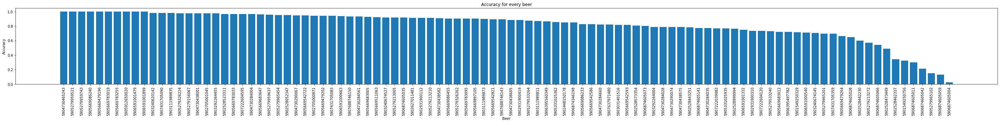

In [ ]:
plt.rcParams["figure.figsize"] = (50,4)
plt.bar(acc_label_list, acc_value_list)
plt.title('Accuracy for every beer')
plt.xlabel('Beer')
plt.ylabel('Accuracy')
plt.xticks(rotation=90)

plt.show()

In [ ]:
#Beers with most accuracy
for x in range(10): print(f'{acc_label_list[x]}:{acc_value_list[x]}')

5904730465243:1.0
5905279959521:1.0
5905279959743:1.0
5905669086240:1.0
5905669479196:1.0
5905669783019:1.0
5905669783255:1.0
5905912650020:1.0
5906591001479:1.0
5906591001899:1.0


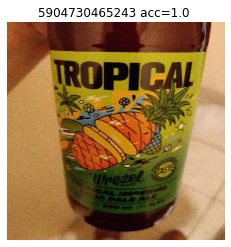

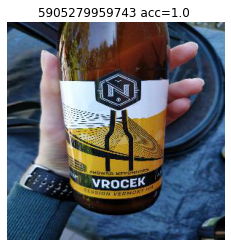

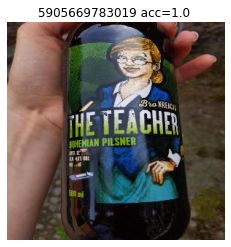

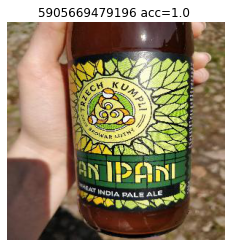

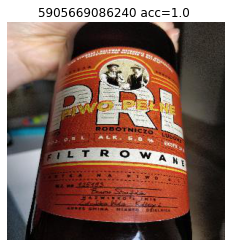

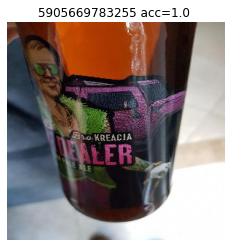

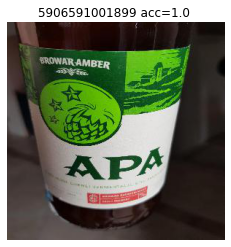

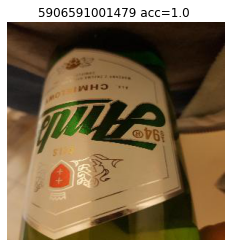

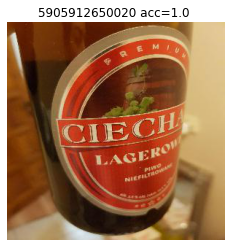

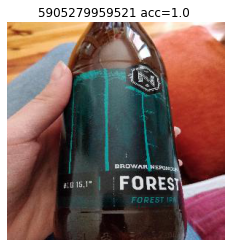

In [ ]:
#Most accurate beers
for dir in data_dir.iterdir():
  beer_name =str(dir)[12:]
  if beer_name in acc_label_list[:10]:
    beer = list(data_dir.glob(f'{beer_name}/*'))
    img = mpimg.imread(str(beer[0]))
    plt.figure()    
    plt.title(f'{beer_name} acc={acc_class.get(beer_name)} ')
    plt.axis("off")
    plt.imshow(img)
    

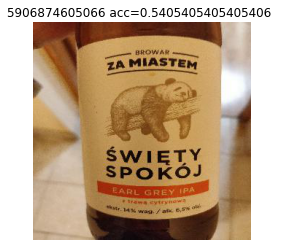

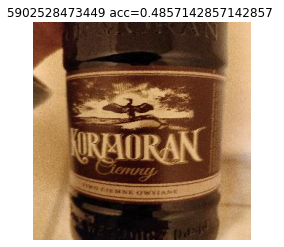

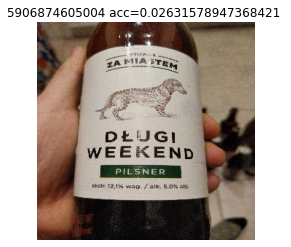

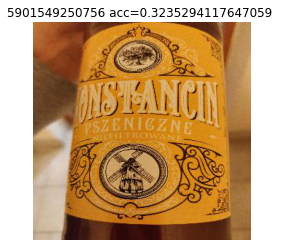

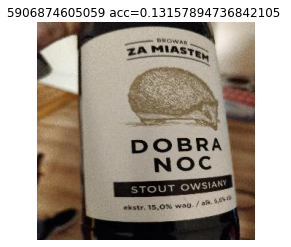

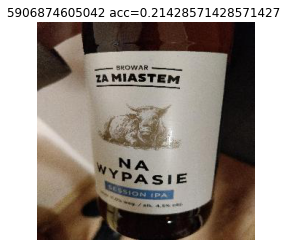

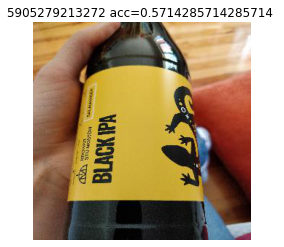

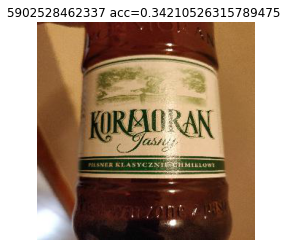

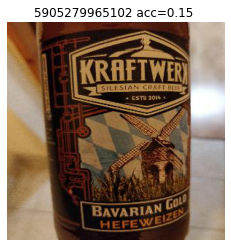

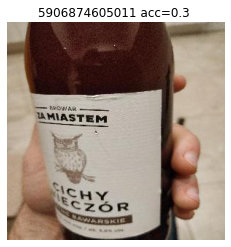

In [ ]:
#Least accurate beers
for dir in data_dir.iterdir():
  beer_name =str(dir)[12:]
  if beer_name in acc_label_list[-10:]:
    beer = list(data_dir.glob(f'{beer_name}/*'))
    img = mpimg.imread(str(beer[0]))
    plt.figure()    
    plt.title(f'{beer_name} acc={acc_class.get(beer_name)} ')
    plt.axis("off")
    plt.imshow(img)

The model clearly has a problem with white label beers. This is probably due to the fact that the "Browar za miastem" labels are very similar to each other. It works well with models of vivid colors.
----------------------------------------------------------------------------
When it is not possible to take new pictures we can generate more data with the help of generator, by transforming already existing pictures. Using SGD it is possible to achieve 85% accuracy with similar learning time. It would be worthwhile to extend the learning period and increase the dropout level. 
----------------------------------------------------------------------------
